# 모듈 입력

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib
import matplotlib.pyplot as plt
import pickle
import lime
from lime import lime_tabular

In [2]:
matplotlib.rc('font',family='Malgun Gothic')
matplotlib.rc('axes', unicode_minus=False)

# 데이터불러오기

In [3]:
# filepath 입력
filepath = "../../data/정제데이터/Merged_Label_1.csv"
# 레이블 칼럼명 입력
label_col= "result"

In [4]:
df = pd.read_csv(filepath,index_col="Unnamed: 0")
df[label_col].value_counts()

0    68110
2    34009
1     7413
Name: result, dtype: int64

In [5]:
df.index

Int64Index([     0,      1,      2,      3,      4,      5,      6,      7,
                 8,      9,
            ...
            109522, 109523, 109524, 109525, 109526, 109527, 109528, 109529,
            109530, 109531],
           dtype='int64', length=109532)

In [6]:
col_num = "003 010 019 036 039 051 055 061 081 082 083 091 092 093 094 095 096 097 098 117 118 121 124 125 126 173 176 196".split(' ')

In [7]:
col_num = ["TAG_{}".format(num) if len(col_num[0])==3 else num for num in col_num ]

In [8]:
df_drop = df.drop([*col_num],axis=1)

In [9]:
df_drop.loc[(df_drop[label_col]==2),label_col]=0
df_droped=df_drop
# df_drop.loc[(df_drop[label_col]==0)]
# df_droped[label_col].value_counts()

In [10]:
df_drop.fillna(df_drop.mean(),inplace=True)

In [11]:
df_x = df_droped.drop(label_col,axis=1,inplace=False)
df_y = df_droped[label_col]

In [12]:
df_train_x,df_test_x, df_train_y, df_test_y = train_test_split(df_x,df_y,test_size=0.3,random_state=1234)

# 학습된 모델 불러오기

In [29]:
path = "./trained_model"

In [30]:
# ann
trained_file = "{}/{}_trained.pickle".format(path,"ann")
with open(trained_file, 'rb') as f:
    ann_model = pickle.load(f)

In [31]:
# dt
trained_file = "{}/{}_trained.pickle".format(path,"dt")
with open(trained_file, 'rb') as f:
    dt_model = pickle.load(f)

In [32]:
# rf
trained_file = "{}/{}_trained.pickle".format(path,"rf")
with open(trained_file, 'rb') as f:
    rf_model = pickle.load(f)

In [33]:
# gb
trained_file = "{}/{}_trained.pickle".format(path,"gb")
with open(trained_file, 'rb') as f:
    gb_model = pickle.load(f)

In [34]:
# hgb
trained_file = "{}/{}_trained.pickle".format(path,"hgb")
with open(trained_file, 'rb') as f:
    hgb_model = pickle.load(f)

In [35]:
# xgb
trained_file = "{}/{}_trained.pickle".format(path,"xgb")
with open(trained_file, 'rb') as f:
    xgb_model = pickle.load(f)

# Lime

## ANN

In [41]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(df_train_x),
    feature_names=df_train_x.columns,
    class_names=["정상", "정지"],
    mode='classification'
)

In [42]:
# ann_lime
ann_exp = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=ann_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [43]:
ann_exp.show_in_notebook(show_table=True)

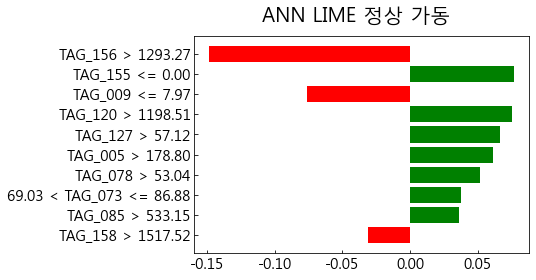

In [44]:
ann_fig = ann_exp.as_pyplot_figure(label=1)
plt.suptitle("ANN LIME 정상 가동",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [45]:
idx = 1
ann_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=ann_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


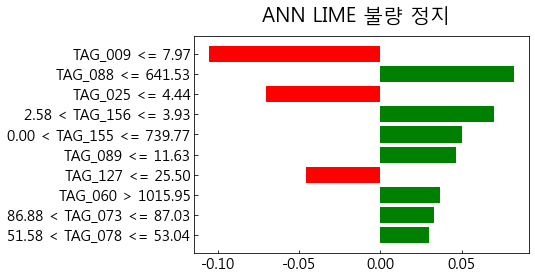

In [46]:
ann_fig = ann_exp.as_pyplot_figure(label=1)
plt.suptitle("ANN LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량2

In [70]:
idx = 7
ann_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=ann_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


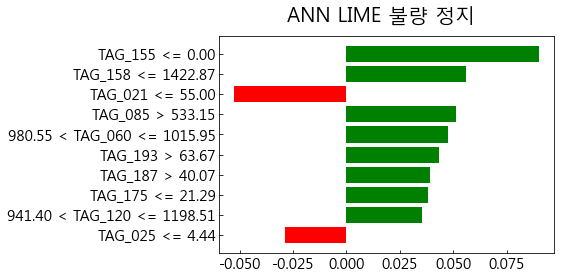

In [71]:
ann_fig = ann_exp.as_pyplot_figure(label=1)
plt.suptitle("ANN LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

## DT

In [47]:
# dt_lime
dt_exp = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=dt_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [48]:
dt_exp.show_in_notebook(show_table=True)

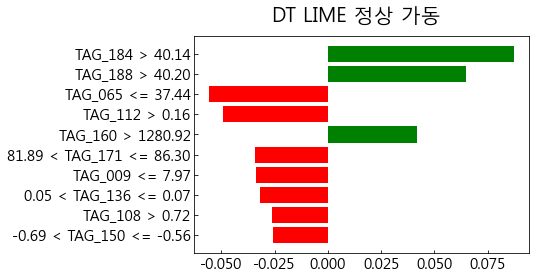

In [69]:
dt_fig = dt_exp.as_pyplot_figure(label=1)
plt.suptitle("DT LIME 정상 가동",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [79]:
idx = 1
dt_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=dt_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


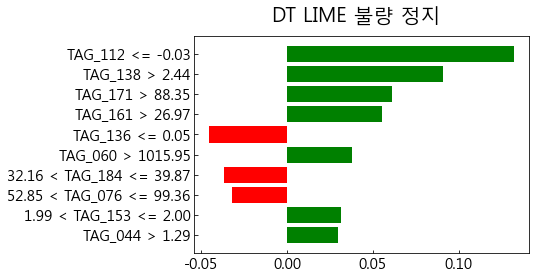

In [80]:
dt_fig = dt_exp.as_pyplot_figure(label=1)
plt.suptitle("DT LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량2

In [81]:
idx = 7
dt_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=dt_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


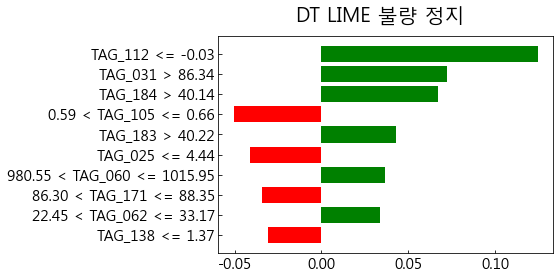

In [82]:
dt_fig = dt_exp.as_pyplot_figure(label=1)
plt.suptitle("DT LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

## RF

In [50]:
# rf_lime
rf_exp = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=rf_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [51]:
rf_exp.show_in_notebook(show_table=True)

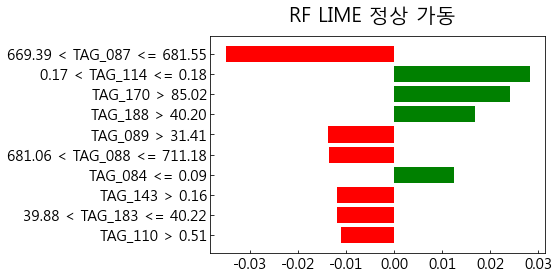

In [68]:
rf_fig = rf_exp.as_pyplot_figure(label=1)
plt.suptitle("RF LIME 정상 가동",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [95]:
idx = 1
rf_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=rf_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


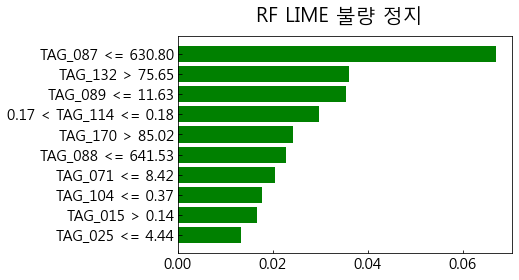

In [96]:
rf_fig = rf_exp.as_pyplot_figure(label=1)
plt.suptitle("RF LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량2

In [97]:
idx = 7
rf_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=rf_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


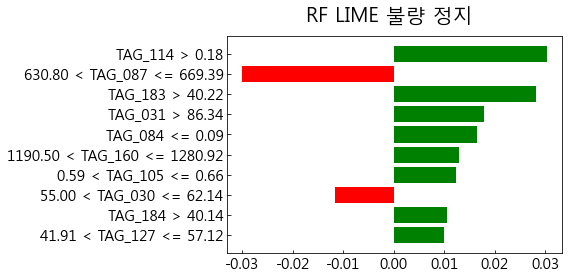

In [98]:
rf_fig = rf_exp.as_pyplot_figure(label=1)
plt.suptitle("RF LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

## GB

In [53]:
gb_exp = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=gb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


In [54]:
gb_exp.show_in_notebook(show_table=True)

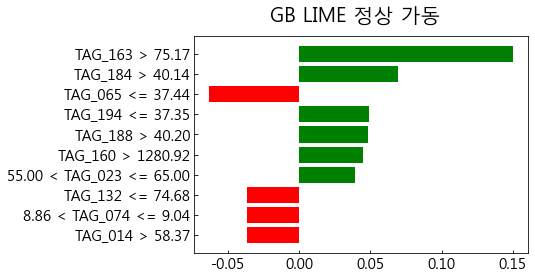

In [67]:
gb_fig = gb_exp.as_pyplot_figure(label=1)
plt.suptitle("GB LIME 정상 가동",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [83]:
idx = 1
gb_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=gb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


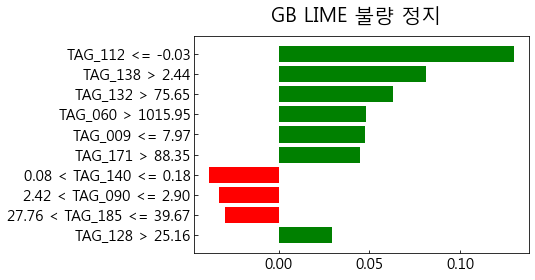

In [84]:
gb_fig = gb_exp.as_pyplot_figure(label=1)
plt.suptitle("GB LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량2

In [85]:
idx = 7
gb_exp = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=gb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


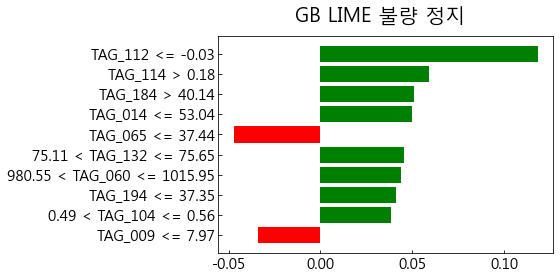

In [86]:
gb_fig = gb_exp.as_pyplot_figure(label=1)
plt.suptitle("GB LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)

## GB

## HGB

In [111]:
hgb_exp1 = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=hgb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
  warnings.warn(


In [112]:
hgb_exp.show_in_notebook(show_table=True)

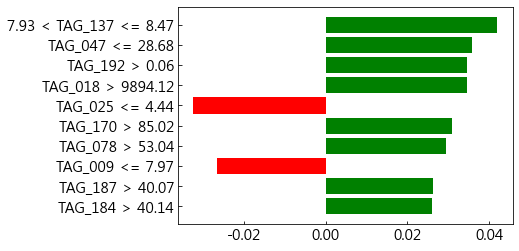

In [118]:
hgb_fig = hgb_exp1.as_pyplot_figure(label=1)
plt.title("")
# plt.yticks([])
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [114]:
idx=1
hgb_exp2 = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=hgb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
  warnings.warn(


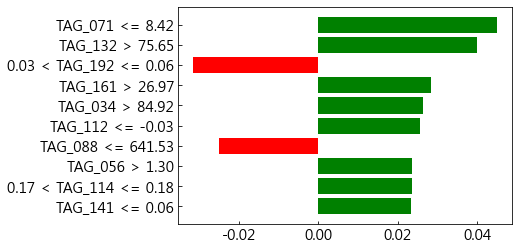

In [119]:
hgb_fig = hgb_exp2.as_pyplot_figure(label=1)
plt.title("")
# plt.yticks([])
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량2

In [123]:
idx=7
hgb_exp3 = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=hgb_model.predict_proba
)

/home/piai/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
  warnings.warn(


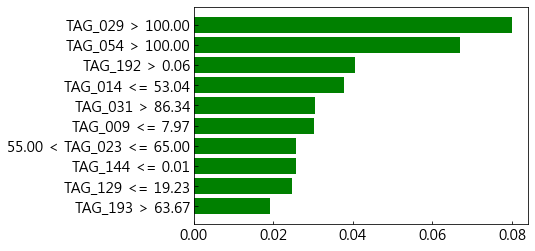

In [124]:
hgb_fig = hgb_exp3.as_pyplot_figure(label=1)
plt.title("")
# plt.yticks([])
plt.tick_params(axis='both', direction='in', labelsize = 15)

## XGB

In [105]:
xgb_exp1 = explainer.explain_instance(
    data_row=df_test_x.iloc[1], 
    predict_fn=xgb_model.predict_proba
)

In [106]:
xgb_exp.show_in_notebook(show_table=True)

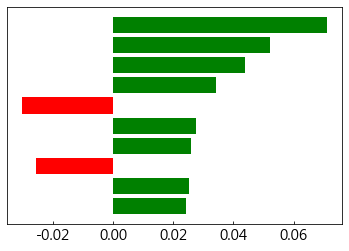

In [107]:
xgb_fig = xgb_exp.as_pyplot_figure(label=1)
# plt.suptitle("XGB LIME 정상 가동",fontsize=20)
plt.title("")
plt.yticks([])
plt.tick_params(axis='both', direction='in', labelsize = 15)

### 불량1

In [108]:
idx=1
xgb_exp2 = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=xgb_model.predict_proba
)

In [ ]:
xgb_fig = xgb_exp2.as_pyplot_figure(label=1)
plt.title("")
plt.yticks([])

### 불량2

In [110]:
idx=7
xgb_exp3 = explainer.explain_instance(
    data_row=df_test_x[df_test_y==1].iloc[idx], 
    predict_fn=xgb_model.predict_proba
)

KeyboardInterrupt: 

In [ ]:
xgb_fig = xgb_exp3.as_pyplot_figure(label=1)
plt.suptitle("XGB LIME 불량 정지",fontsize=20)
plt.title("")
plt.tick_params(axis='both', direction='in', labelsize = 15)